## ML4CommNet Project

### Data import

In [1]:
bulb_ip = [1,2,12,13,23,24,34,35,45,46,47,54,55,65,66,76,77,87,88,98,99,100, 
          107,108,118,119,129,130,140,141,151,152,153]
camera_ip = [3,14,25,36,48,56,67,78,89,101,109,120,131,142,154]
fire_ip = [4,15,26,37,49,57,68,79,90,102,110,121,132,143,155]
plug_ip = [5,6,7,8,9,16,17,18,19,20,27,28,29,30,31,38,39,40,41,42,50,51,52,58,59,60,61,62,
          69,70,71,72,73,80,81,82,83,84,91,92,93,94,95,103,104,105,111,112,113,114,
          115,122,123,124,125,126,133,134,135,136,137,144,145,146,147,148,156,157,158]
smart_tv_ip = [10,21,32,43,63,74,85,96,116,127,138,149]
thermo_ip = [11,22,33,44,53,64,75,86,97,106,117,128,139,150,159]
quick_ip = [160]
heavy_ip = [162]
connect_ip = [161]

not_attack_sensors = ['Camera', 'SmartTv','Thermo', 'Bulb', 'Plug', 'Fire']
attack_sensors = ['Quick', 'Heavy', 'Connect']

def label_attack(row):
    if any('{}'.format(i) in row['Sensor'] for i in attack_sensors):
        return 'Attack'
    if any('{}'.format(i) in row['Sensor'] for i in not_attack_sensors):
        return 'NotAttack'
    
    return 'Error'

def label_sensor(row):
    if any('.{}.'.format(i) in row['SrcAddr'] for i in bulb_ip):
        return 'Bulb'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in camera_ip):
        return 'Camera'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in fire_ip):
        return 'Fire'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in plug_ip):
        return 'Plug'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in smart_tv_ip):
        return 'SmartTv'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in thermo_ip):
        return 'Thermo'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in quick_ip):
        return 'Quick'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in heavy_ip):
        return 'Heavy'
    if any('.{}.'.format(i) in row['SrcAddr'] for i in connect_ip):
        return 'Connect'
    
    return 'Other'

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# read dataframe from...
df_NaN = pd.read_csv('experiments/3rd_time.csv', skiprows=1, delim_whitespace=True, names=['StartTime', 'Proto', 'SrcAddr', 'DstAddr', 'TotPkts', 'SrcPkts', 'DstPkts', 'TotBytes', 'SrcBytes', 'DstBytes', 'Dur', 'Load', 'SrcLoad', 'DstLoad', 'Loss', 'SrcLoss', 'DstLoss', 'pLoss', 'Retrans', 'SrcRetra', 'DstRetra', 'pRetran', 'Rate', 'SrcRate', 'DstRate', 'Dir', 'State', 'SrcWin', 'DstWin', 'TcpRtt', 'SynAck', 'AckDat'])

# assign labels to the sensors
df_NaN['Sensor'] = df_NaN.apply(lambda row: label_sensor(row), axis=1)

df_NaN['Type'] = df_NaN.apply(lambda row: label_attack(row), axis=1)

print("Feature number => {}".format(df_NaN.shape[1]))
df_NaN.head()


Feature number => 34


,StartTime,Proto,SrcAddr,DstAddr,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,...,DstRate,Dir,State,SrcWin,DstWin,TcpRtt,SynAck,AckDat,Sensor,Type
0,08:25:59.090448,tcp,10.0.0.1.55917,10.0.0.251.1883,20,12,8,2338,1762,576,...,15.235310,->,CON,42496.0,43520.0,0.018033,0.000033,0.018000,Bulb,NotAttack
1,08:25:59.094300,tcp,10.0.0.1.35823,10.0.0.251.1883,34,18,16,4476,2530,1946,...,32.768837,->,CON,42496.0,43008.0,0.018306,0.000011,0.018295,Bulb,NotAttack
2,08:26:00.100277,tcp,10.0.0.2.46593,10.0.0.251.1883,18,10,8,2086,1534,552,...,92.197456,->,CON,42496.0,43520.0,0.015487,0.000024,0.015463,Bulb,NotAttack
3,08:26:00.103388,tcp,10.0.0.2.42113,10.0.0.251.1883,24,14,10,3004,2260,744,...,112.488754,->,CON,42496.0,43008.0,0.014377,0.000019,0.014358,Bulb,NotAttack
4,08:26:01.189641,tcp,10.0.0.3.59795,10.0.0.251.1883,20,12,8,1806,1230,576,...,10.536425,->,CON,42496.0,43520.0,0.016635,0.000032,0.016603,Camera,NotAttack


In [3]:
df_NaN

,StartTime,Proto,SrcAddr,DstAddr,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,...,DstRate,Dir,State,SrcWin,DstWin,TcpRtt,SynAck,AckDat,Sensor,Type
0,08:25:59.090448,tcp,10.0.0.1.55917,10.0.0.251.1883,20,12,8,2338,1762,576,...,15.235310,->,CON,42496.0,43520.0,0.018033,0.000033,0.018000,Bulb,NotAttack
1,08:25:59.094300,tcp,10.0.0.1.35823,10.0.0.251.1883,34,18,16,4476,2530,1946,...,32.768837,->,CON,42496.0,43008.0,0.018306,0.000011,0.018295,Bulb,NotAttack
2,08:26:00.100277,tcp,10.0.0.2.46593,10.0.0.251.1883,18,10,8,2086,1534,552,...,92.197456,->,CON,42496.0,43520.0,0.015487,0.000024,0.015463,Bulb,NotAttack
3,08:26:00.103388,tcp,10.0.0.2.42113,10.0.0.251.1883,24,14,10,3004,2260,744,...,112.488754,->,CON,42496.0,43008.0,0.014377,0.000019,0.014358,Bulb,NotAttack
4,08:26:01.189641,tcp,10.0.0.3.59795,10.0.0.251.1883,20,12,8,1806,1230,576,...,10.536425,->,CON,42496.0,43520.0,0.016635,0.000032,0.016603,Camera,NotAttack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113520,15:32:07.289791,tcp,10.0.0.160.34069,10.0.0.251.1883,784,432,352,1247792,1224560,23232,...,70.495140,->,CON,42496.0,55869.0,0.006598,0.000025,0.006573,Quick,Attack
113521,15:32:12.293055,tcp,10.0.0.160.34069,10.0.0.251.1883,524,470,54,194784,191220,3564,...,67.642853,->,RST,42496.0,55879.0,0.006598,0.000025,0.006573,Quick,Attack
113522,15:33:12.806063,tcp,10.0.0.162.37431,10.0.0.251.1883,272,162,110,330384,323100,7284,...,71.489563,->,RST,42496.0,248832.0,0.010739,0.000024,0.010715,Heavy,Attack
113523,15:33:38.396628,tcp,10.0.0.160.47065,10.0.0.251.1883,906,492,414,1257654,1230306,27348,...,82.652687,->,CON,42496.0,208384.0,0.006295,0.000024,0.006271,Quick,Attack


Classes are quite unbalanced, especially the _heavy payload attack_ is low represented.


#### Check NaN columns

What's happening with NaN? `argus` columns indentation sometimes has problems and pandas messed up with it. We lose information in the `SynAck` and in the `AckDat` columns (the last two). Not a big deal, as we can see later on these two columns are pretty useless (variance is almost 0, unfortunately also due to the NaN). For this reason, we decided to convert NaN to 0.

In [4]:
is_NaN = df_NaN.isnull()
row_has_NaN = is_NaN.any(axis=1)
rows_with_NaN = df_NaN[row_has_NaN]
rows_with_NaN

# SynAck AckDat

,StartTime,Proto,SrcAddr,DstAddr,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,...,DstRate,Dir,State,SrcWin,DstWin,TcpRtt,SynAck,AckDat,Sensor,Type
3729,08:31:20.414772,tcp,10.0.0.161.52603,10.0.0.251.1883,20,0,20,15220,0,15220,...,5.890667,->,CON,0.004731,0.000017,0.004714,NaN,NaN,Connect,Attack
3731,08:31:20.414801,tcp,10.0.0.161.34043,10.0.0.251.1883,20,0,20,15736,0,15736,...,5.832842,->,CON,0.004729,0.000010,0.004719,NaN,NaN,Connect,Attack
3732,08:31:20.414812,tcp,10.0.0.161.42989,10.0.0.251.1883,20,0,20,15700,0,15700,...,5.832812,->,CON,0.005016,0.000009,0.005007,NaN,NaN,Connect,Attack
3733,08:31:20.414822,tcp,10.0.0.161.35123,10.0.0.251.1883,20,0,20,15700,0,15700,...,5.832833,->,CON,0.005610,0.000010,0.005600,NaN,NaN,Connect,Attack
3734,08:31:20.414832,tcp,10.0.0.161.44875,10.0.0.251.1883,20,0,20,15254,0,15254,...,5.890817,->,CON,0.005308,0.000016,0.005292,NaN,NaN,Connect,Attack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113486,15:28:24.031142,tcp,10.0.0.160.37819,10.0.0.251.1883,438,438,0,1227852,1227852,0,...,0.000000,->,CON,42496.000000,0.006285,0.000024,0.006261,NaN,Quick,Attack
113487,15:28:29.045502,tcp,10.0.0.160.37819,10.0.0.251.1883,440,440,0,1225088,1225088,0,...,0.000000,->,CON,42496.000000,0.006285,0.000024,0.006261,NaN,Quick,Attack
113498,15:29:19.122966,tcp,10.0.0.160.37819,10.0.0.251.1883,422,422,0,1223900,1223900,0,...,0.000000,->,CON,42496.000000,0.006285,0.000024,0.006261,NaN,Quick,Attack
113518,15:31:57.261010,tcp,10.0.0.160.34069,10.0.0.251.1883,436,436,0,1227720,1227720,0,...,0.000000,->,CON,42496.000000,0.006598,0.000025,0.006573,NaN,Quick,Attack


In [5]:
# convert NaN to 0 and drop the `Other` class 
df_NaN = df_NaN.drop(df_NaN[df_NaN.Sensor == 'Other'].index)
df = df_NaN.fillna(0)

In [6]:
df['Sensor'].value_counts()

Plug       32023
Connect    31631
Bulb       14514
Camera      8405
Thermo      6759
Fire        6416
SmartTv     6367
Quick       6122
Heavy        622
Name: Sensor, dtype: int64

# Dataset Features

In [7]:
print("Dataset columns: \n{}".format(df.columns.to_list()))

Dataset columns: 
['StartTime', 'Proto', 'SrcAddr', 'DstAddr', 'TotPkts', 'SrcPkts', 'DstPkts', 'TotBytes', 'SrcBytes', 'DstBytes', 'Dur', 'Load', 'SrcLoad', 'DstLoad', 'Loss', 'SrcLoss', 'DstLoss', 'pLoss', 'Retrans', 'SrcRetra', 'DstRetra', 'pRetran', 'Rate', 'SrcRate', 'DstRate', 'Dir', 'State', 'SrcWin', 'DstWin', 'TcpRtt', 'SynAck', 'AckDat', 'Sensor', 'Type']


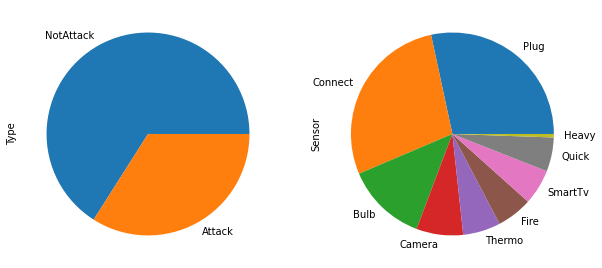

In [8]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
df['Type'].value_counts().plot(kind='pie', ax=ax[0])
df['Sensor'].value_counts().plot(kind='pie', ax=ax[1])

plt.show()


In [9]:
df_describe = df[['TotPkts', 'TotBytes', 'Dur', 'Load', 'Loss', 'Rate', 'Sensor']].groupby('Sensor').describe()
df_describe.columns = df_describe.columns.swaplevel(0, 1)
df_describe[['mean', 'std']]

mean                                                    \
            TotPkts      TotBytes       Dur          Load        Loss   
Sensor                                                                  
Bulb       1.682651  1.388224e+02  0.653674  3.790306e+04    0.993179   
Camera    40.408804  5.645057e+04  1.519279  1.650887e+05   10.566092   
Connect   10.174765  3.461238e+03  1.707557  7.999431e+05    3.221681   
Fire       1.766365  1.571061e+02  0.662444  1.300059e+05    1.092737   
Heavy    243.361736  3.069018e+05  1.528440  1.423149e+06   56.744373   
Plug       1.869844  1.800889e+02  0.624163  2.189014e+05    1.008119   
Quick    745.405913  1.138011e+06  4.606533  1.874050e+06  173.558968   
SmartTv   14.777446  1.960478e+04  0.894348  3.586068e+05    4.125962   
Thermo     1.697145  1.485563e+02  0.632691  8.139384e+04    0.944814   

                              std                                         \
                 Rate     TotPkts       TotBytes       Dur          Load   
Sensor                                                                     
Bulb      8160.158628    1.895323     225.762460  1.343383  3.520563e+05   
Camera   11285.251674   75.192470  109985.548643  1.950521  4.797918e+05   
Connect  36390.510723    9.123763    7287.409571  1.747873  1.893678e+06   
Fire      9867.351985    1.880896     230.033159  1.353715  6.335320e+05   
Heavy      502.375636  139.669380  181443.863131  0.806825  7.407844e+05   
Plug     15935.979600    2.007695     254.381780  1.329431  9.292634e+05   
Quick      357.933221  297.316180  333764.248148  1.198681  4.920537e+05   
SmartTv  10773.359384   44.147743   67560.093038  1.640324  8.211660e+05   
Thermo   13133.895005    1.776297     185.533519  1.336160  5.243938e+05   

                                   
              Loss           Rate  
Sensor                             
Bulb      0.880918   52996.507148  
Camera   18.698211   67365.308392  
Connect   4.107039  140039.598449  
Fire      0.907904   58758.628517  
Heavy    32.295893    6458.236489  
Plug      0.926772   84087.564368  
Quick    84.344676    5394.938020  
SmartTv  11.050373   67600.016321  
Thermo    0.853627   71442.425628

## Data visualization

some stuff with jointplots and booh

In [10]:

import plotly.express as px
from plotly.figure_factory import create_distplot

In [46]:
dat = [df_normalized[df_normalized.Type == "NotAttack"]["DstBytes"], df_normalized[df_normalized.Type == "Attack"]["DstBytes"]]

In [49]:
fig = create_distplot(dat, ["NotAttack", "Attack"], show_hist=False, histnorm="probability", curve_type="normal", bin_size=.005)
fig.show()

In [57]:
feature = "SrcPkts"
dat = [df[df.Sensor == sens][feature] for sens in df.Sensor.unique()]

fig = create_distplot(dat, df.Sensor.unique(),  curve_type="normal", bin_size=5)
#fig.suptitle(feature)
fig.show()

In [55]:
ax = sns.distplot(df_encoder, hue="Sensor")

TypeError: distplot() got an unexpected keyword argument 'hue'

# Data cleaning

#### Deleting columns with only one value

In [12]:
print("Columns with only one element: {}".format(df.loc[:,df.apply(pd.Series.nunique) == 1].columns.to_list()))

df_clean_cols = df.loc[:,df.apply(pd.Series.nunique) != 1]

print("Removed!")
print("Feature number => {}".format(df_clean_cols.shape[1]))

Columns with only one element: ['Proto', 'DstAddr', 'Retrans', 'SrcRetra', 'DstRetra', 'pRetran']
Removed!
Feature number => 28


In [13]:
null_counts = df_clean_cols.isnull().sum()
#print("Number of null values in each column:\n{}".format(null_counts))

##### Checking type of feature 

In [14]:
print("Data types and their frequency\n{}".format(df_clean_cols.dtypes.value_counts()))
print("\n\n")
object_columns_df = df_clean_cols.select_dtypes(include=['object'])
print(object_columns_df.iloc[0])

Data types and their frequency
float64    13
int64       9
object      6
dtype: int64



StartTime    08:25:59.090448
SrcAddr       10.0.0.1.55917
Dir                       ->
State                    CON
Sensor                  Bulb
Type               NotAttack
Name: 0, dtype: object


###### Drop useless features

In [15]:
useless_cols = ['StartTime', 'SrcAddr']
try:
    df_clean_cols = df_clean_cols.drop(useless_cols, axis=1, inplace=False)
except KeyError as e:
    print("Already removed!")
print("Feature number => {}".format(df_clean_cols.shape[1]))

Feature number => 26


###### Check columns with few unique values

In [16]:
from numpy import unique

for i in df_clean_cols.columns:
    num = len(df_clean_cols[i].unique())
    percentage = float(num) / df_clean_cols.shape[0] * 100
    print('%s, %d, %.1f%%' % (i, num, percentage))

TotPkts, 688, 0.6%
SrcPkts, 452, 0.4%
DstPkts, 286, 0.3%
TotBytes, 7474, 6.6%
SrcBytes, 3441, 3.0%
DstBytes, 3609, 3.2%
Dur, 40189, 35.6%
Load, 42243, 37.4%
SrcLoad, 38284, 33.9%
DstLoad, 28352, 25.1%
Loss, 292, 0.3%
SrcLoss, 293, 0.3%
DstLoss, 25, 0.0%
pLoss, 2219, 2.0%
Rate, 41941, 37.2%
SrcRate, 37602, 33.3%
DstRate, 29319, 26.0%
Dir, 4, 0.0%
State, 5, 0.0%
SrcWin, 836, 0.7%
DstWin, 3728, 3.3%
TcpRtt, 5825, 5.2%
SynAck, 1347, 1.2%
AckDat, 5491, 4.9%
Sensor, 9, 0.0%
Type, 2, 0.0%


###### Remove low variance columns

--> Threshold=0.00, Features=22
Low variance features:  ['SrcRetra', 'pRetran', 'Retrans', 'DstRetra']
--> Threshold=0.05, Features=21
Low variance features:  ['SrcRetra', 'Retrans', 'DstRetra', 'pRetran', 'SynAck']
--> Threshold=0.10, Features=21
Low variance features:  ['SrcRetra', 'Retrans', 'DstRetra', 'pRetran', 'SynAck']
--> Threshold=0.15, Features=21
Low variance features:  ['SrcRetra', 'Retrans', 'DstRetra', 'pRetran', 'SynAck']
--> Threshold=0.20, Features=19
Low variance features:  ['TcpRtt', 'SrcRetra', 'Retrans', 'DstRetra', 'AckDat', 'pRetran', 'SynAck']
--> Threshold=0.25, Features=19
Low variance features:  ['TcpRtt', 'SrcRetra', 'Retrans', 'DstRetra', 'AckDat', 'pRetran', 'SynAck']
--> Threshold=0.30, Features=19
Low variance features:  ['TcpRtt', 'SrcRetra', 'Retrans', 'DstRetra', 'AckDat', 'pRetran', 'SynAck']
--> Threshold=0.35, Features=19
Low variance features:  ['TcpRtt', 'SrcRetra', 'Retrans', 'DstRetra', 'AckDat', 'pRetran', 'SynAck']
--> Threshold=0.40, Featur

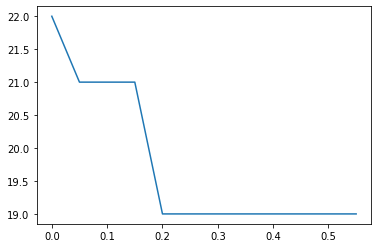

In [17]:
from sklearn.feature_selection import VarianceThreshold
from matplotlib import pyplot
import numpy as np

# split data into inputs and outputs
X = df._get_numeric_data()
data = X
y = df.values[:, -1]

all_features = X.columns.to_list()
thresholds = np.arange(0.0, 0.60, 0.05)

results = list()
for t in thresholds:
    # define the transform
    transform = VarianceThreshold(threshold=t)
    # transform the input data
    X_sel = transform.fit_transform(X)
    # determine the number of input features
    n_features = X_sel.shape[1]
    remained_features = data[data.columns[transform.get_support(indices=True)]].columns.to_list()
    print('--> Threshold=%.2f, Features=%d' % (t, n_features))
    print("Low variance features: ", list(set(all_features) - set(remained_features)))
    results.append(n_features)
    
# threshold vs number of selected features
pyplot.plot(thresholds, results)
pyplot.show()


In [18]:
# Drop columns (could drop also ['SrcRetra', 'pRetran', 'TcpRtt', 'DstRetra', 'AckDat', 'Retrans'])
useless_cols = ['SynAck', 'DstLoss']
df_variance = df_clean_cols
try:
    df_variance = df_variance.drop(useless_cols, axis=1)
except KeyError as e:
    print("Already removed!")
print("Feature number => {}".format(df_variance.shape[1]))


Feature number => 24


### Row with duplicated data

In [19]:
# check duplicates
print("Size of the dataset before row cleaning:", df_variance.shape)
dups = df_variance.duplicated()
print(dups.any())
df_clean = df_variance.drop_duplicates(inplace=False)
print("Size of the dataset after row cleaning:", df_clean.shape)

# TODO: clean only high value counts sensors

Size of the dataset before row cleaning: (112859, 24)
True
Size of the dataset after row cleaning: (56304, 24)


#### Check Class distribution after cleaning

Connects have too many values, let's reduce connect to Plug

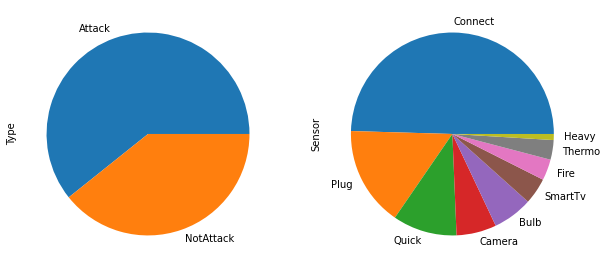

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
df_clean['Type'].value_counts().plot(kind='pie', ax=ax[0])
df_clean['Sensor'].value_counts().plot(kind='pie', ax=ax[1])

plt.show()

In [21]:
from sklearn.utils import resample

df_not_connect = df_clean[df_clean.Sensor!='Connect']
df_connect = df_clean[df_clean.Sensor=='Connect']

# Downsample majority class
df_connect_downsampled = resample(df_connect, 
                                 replace=False,    
                                 n_samples=9000,     
                                 random_state=123) 

df_clean_downsampled = pd.concat([df_connect_downsampled, df_not_connect])
df_clean_downsampled['Sensor'].value_counts()

Connect    9000
Plug       8943
Quick      5762
Camera     3585
Bulb       3576
SmartTv    2359
Fire       1889
Thermo     1758
Heavy       539
Name: Sensor, dtype: int64

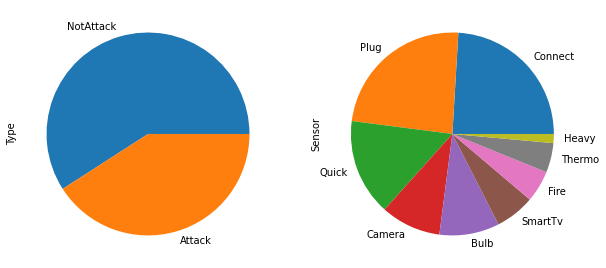

In [22]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
df_clean_downsampled['Type'].value_counts().plot(kind='pie', ax=ax[0])
df_clean_downsampled['Sensor'].value_counts().plot(kind='pie', ax=ax[1])

plt.show()

### Normalize DataFrame

In [23]:
from pandas.api.types import is_numeric_dtype

def normalize(df):
    result = df.copy()
    for feature_name in df.columns:
        if is_numeric_dtype(df[feature_name]):
            max_value = df[feature_name].max()
            min_value = df[feature_name].min()
            result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
        else:
            result[feature_name] = df[feature_name]
    return result


df_normalized = normalize(df_clean_downsampled.drop(9079))
df_normalized.head(5)

,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Dur,Load,SrcLoad,DstLoad,...,SrcRate,DstRate,Dir,State,SrcWin,DstWin,TcpRtt,AckDat,Sensor,Type
12229,0.003981,0.004292,0.003215,0.000522,0.000455,0.003149,0.831979,0.000113,0.000098,0.000015,...,2.163516e-06,2.403910e-07,->,RST,0.048881,0.043545,0.000439,0.000438,Connect,Attack
15054,0.001810,0.001717,0.003215,0.000293,0.000226,0.002987,0.000409,0.111275,0.082299,0.028974,...,1.467710e-03,4.892368e-04,->,CON,0.048881,0.022254,0.000200,0.000199,Connect,Attack
4012,0.014839,0.002575,0.057878,0.035688,0.000319,0.912001,0.888872,0.007976,0.000059,0.007911,...,1.125021e-06,7.875150e-06,->,CON,0.048881,0.043545,0.000516,0.000514,Connect,Attack
5588,0.001810,0.000858,0.006431,0.000306,0.000119,0.005974,0.819433,0.000058,0.000014,0.000043,...,2.440710e-07,7.322140e-07,->,ACC,0.024935,0.022254,0.000001,0.000000,Connect,Attack
5167,0.001810,0.000858,0.006431,0.000287,0.000106,0.005813,0.103401,0.000437,0.000102,0.000334,...,1.934214e-06,5.802641e-06,->,FIN,0.048881,0.043545,0.000807,0.000806,Connect,Attack


### Label encoder
Convert string column into numbers... No more string column values
In this case we choose _One Hot Encode_ for the encoding of the feature `Dir` e `State`. The _One Hot Encoder_ is used when there's no relationship between the existing categories. 
- `Dir` represents whether the traffic stream is inbound or outbond (from the sensor to the broker or viceversa)
- `State` represents the TCP state of that stream

In [24]:
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return res 

features_to_encode = ['Dir', 'State']

df_encoder = df_normalized
for feature in features_to_encode:
    df_encoder = encode_and_bind(df_encoder, feature)
    
df_encoder.head(3)

,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Dur,Load,SrcLoad,DstLoad,...,Type,Dir_->,Dir_<?,Dir_<?>,Dir_?>,State_ACC,State_CON,State_FIN,State_REQ,State_RST
12229,0.003981,0.004292,0.003215,0.000522,0.000455,0.003149,0.831979,0.000113,0.000098,0.000015,...,Attack,1,0,0,0,0,0,0,0,1
15054,0.001810,0.001717,0.003215,0.000293,0.000226,0.002987,0.000409,0.111275,0.082299,0.028974,...,Attack,1,0,0,0,0,1,0,0,0
4012,0.014839,0.002575,0.057878,0.035688,0.000319,0.912001,0.888872,0.007976,0.000059,0.007911,...,Attack,1,0,0,0,0,1,0,0,0


In [25]:
#df_encoder = df_labels

try:
    df_encoder.Type = df_encoder.Type.map({'Attack': 1, 'NotAttack': 0}).astype(int)
    df_encoder.Sensor = df_encoder.Sensor.map({'Bulb': 0, 'Camera': 1, 'Fire': 2, 'Plug': 3, 'SmartTv': 4, 'Thermo': 5,
                                                 'Connect': 6, 'Quick': 7, 'Heavy': 8}).astype(int)
except ValueError as e:
    print("Already done", e)


df_encoder.head(3)

,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Dur,Load,SrcLoad,DstLoad,...,Type,Dir_->,Dir_<?,Dir_<?>,Dir_?>,State_ACC,State_CON,State_FIN,State_REQ,State_RST
12229,0.003981,0.004292,0.003215,0.000522,0.000455,0.003149,0.831979,0.000113,0.000098,0.000015,...,1,1,0,0,0,0,0,0,0,1
15054,0.001810,0.001717,0.003215,0.000293,0.000226,0.002987,0.000409,0.111275,0.082299,0.028974,...,1,1,0,0,0,0,1,0,0,0
4012,0.014839,0.002575,0.057878,0.035688,0.000319,0.912001,0.888872,0.007976,0.000059,0.007911,...,1,1,0,0,0,0,1,0,0,0


In [26]:
df_encoder

,TotPkts,SrcPkts,DstPkts,TotBytes,SrcBytes,DstBytes,Dur,Load,SrcLoad,DstLoad,...,Type,Dir_->,Dir_<?,Dir_<?>,Dir_?>,State_ACC,State_CON,State_FIN,State_REQ,State_RST
12229,0.003981,0.004292,0.003215,0.000522,0.000455,0.003149,0.831979,0.000113,0.000098,0.000015,...,1,1,0,0,0,0,0,0,0,1
15054,0.001810,0.001717,0.003215,0.000293,0.000226,0.002987,0.000409,0.111275,0.082299,0.028974,...,1,1,0,0,0,0,1,0,0,0
4012,0.014839,0.002575,0.057878,0.035688,0.000319,0.912001,0.888872,0.007976,0.000059,0.007911,...,1,1,0,0,0,0,1,0,0,0
5588,0.001810,0.000858,0.006431,0.000306,0.000119,0.005974,0.819433,0.000058,0.000014,0.000043,...,1,1,0,0,0,1,0,0,0,0
5167,0.001810,0.000858,0.006431,0.000287,0.000106,0.005813,0.103401,0.000437,0.000102,0.000334,...,1,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113520,0.283388,0.185408,0.565916,0.978070,0.986915,0.468898,0.995814,0.200237,0.196555,0.003724,...,1,1,0,0,0,0,1,0,0,0
113521,0.189287,0.201717,0.086817,0.152644,0.154111,0.071933,0.156705,0.198612,0.195081,0.003573,...,1,1,0,0,0,0,0,0,0,1
113522,0.098082,0.069528,0.176849,0.258937,0.260397,0.147015,0.304940,0.172456,0.168703,0.003789,...,1,1,0,0,0,0,0,0,0,1
113523,0.327543,0.211159,0.665595,0.985801,0.991546,0.551972,0.999363,0.201160,0.196831,0.004370,...,1,1,0,0,0,0,1,0,0,0


### Export dataset to csv

In [27]:
df_encoder.to_csv('dataset_no_encoding.csv', index=False)

In [28]:
df_encoder.columns
for indx, col in enumerate(df_encoder.columns):
    print("Feature: {}: {}".format(indx, col))

Feature: 0: TotPkts
Feature: 1: SrcPkts
Feature: 2: DstPkts
Feature: 3: TotBytes
Feature: 4: SrcBytes
Feature: 5: DstBytes
Feature: 6: Dur
Feature: 7: Load
Feature: 8: SrcLoad
Feature: 9: DstLoad
Feature: 10: Loss
Feature: 11: SrcLoss
Feature: 12: pLoss
Feature: 13: Rate
Feature: 14: SrcRate
Feature: 15: DstRate
Feature: 16: SrcWin
Feature: 17: DstWin
Feature: 18: TcpRtt
Feature: 19: AckDat
Feature: 20: Sensor
Feature: 21: Type
Feature: 22: Dir_->
Feature: 23: Dir_<?
Feature: 24: Dir_<?>
Feature: 25: Dir_?>
Feature: 26: State_ACC
Feature: 27: State_CON
Feature: 28: State_FIN
Feature: 29: State_REQ
Feature: 30: State_RST


- StartTime: record start time
- Proto: transaction protocol
- SrcAddr: source IP address
- DstAddr: destination IP address
- TotPkts: total transaction packet count
- SrcPkts: src -> dest packet count
- DstPkts: dest -> src packet count
- TotBytes: total bytes
- SrcBytes: source bytes
- DstBytes: destination bytes
- Dur: stream duration
- Load: bits per second
- SrcLoad: source bit per second
- DstLoad: destinatio bit per second
- Loss: pkts retransmitted or dropped
- SrcLoss: source packets retransmitted or dropped
- pLoss: percent pkts retransmitted or dropped
- Rate: pkts per second
- SrcRate: source pkts per second
- DstRate: destination pkts per second
- Dir: direction of transaction
- State: transaction state
- SrcWin: source TCP window advertsement
- DstWin: destination TCP window advertisement
- TcpRtt: TCP connection setup round-trip time, the sum of 'synack' and 'ackdat'.
- AckDat: time between the SYN_ACK and the ACK packets.
- SynAck: time between the SYN and the SYN_ACK packets
- Retrans: pkts retransmitted
- SrcRetra: source pkts retransmitted
- DstRetra: destination pkts retransmitted
- pRetran: percent pkts retransmitted

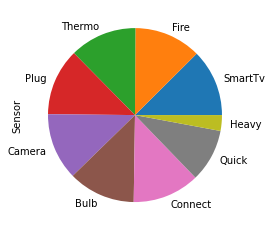

In [137]:
df_downsampled['Sensor'].value_counts().plot(kind='pie')
plt.show()